In [1]:
import cv2
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import pandas as pd
import seaborn as sns
from sklearn.metrics import confusion_matrix
from tqdm import tqdm

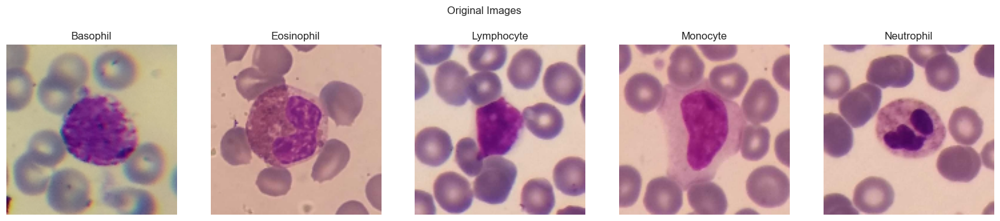

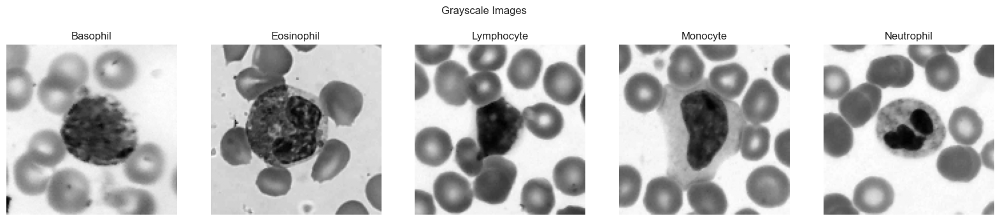

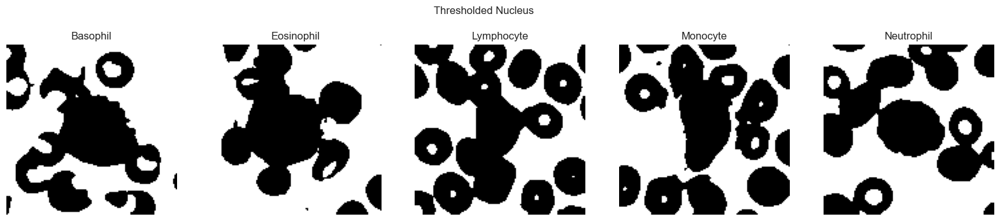

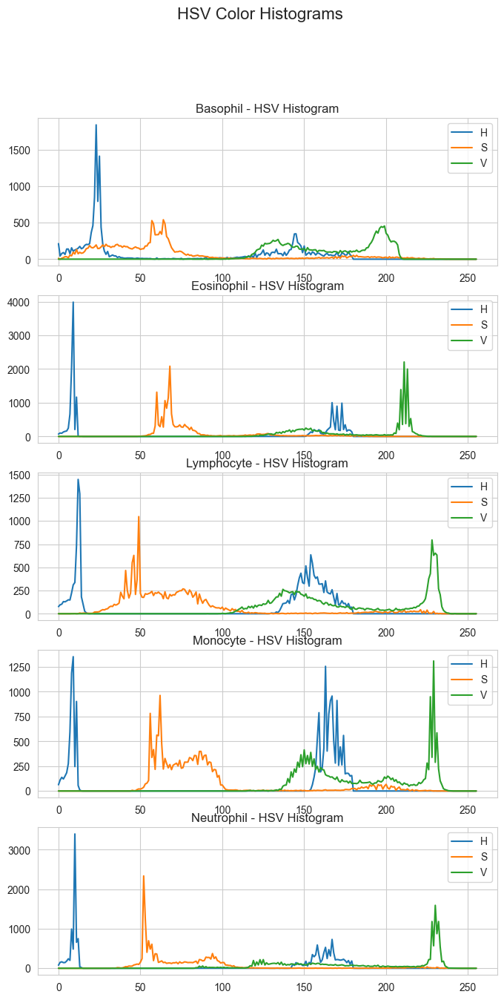

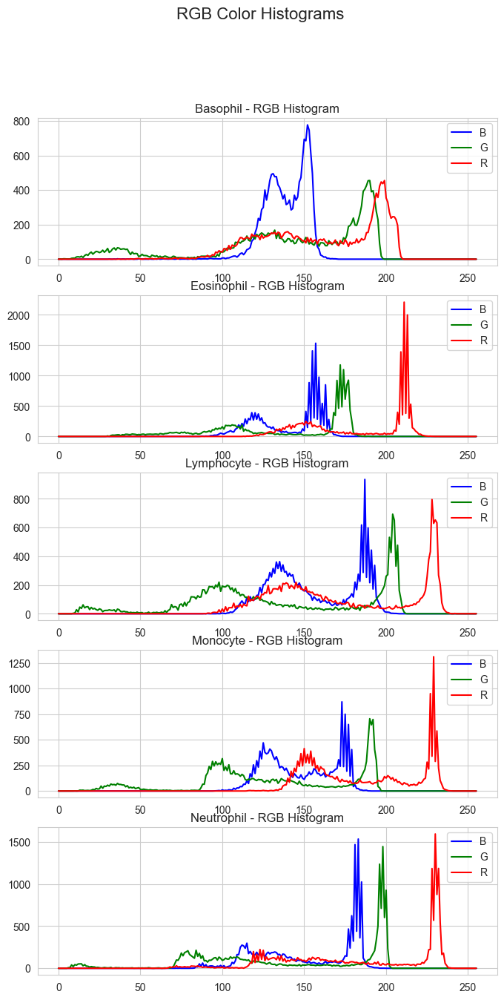

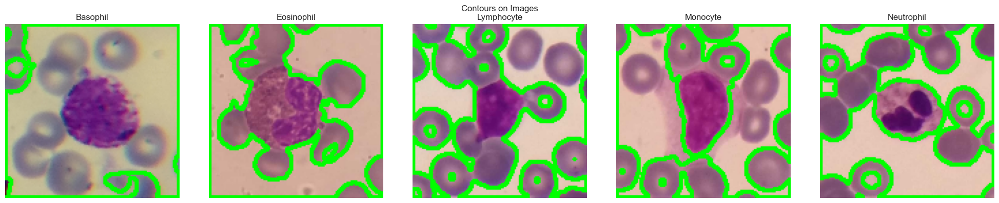

In [2]:
# File paths
images = {
    "Basophil": r"E:\2. DIP\2. LAB\pythonProject\Projects\Assignment 2\wbc_data\Train\Basophil\Basophil_1.jpg",
    "Eosinophil": r"E:\2. DIP\2. LAB\pythonProject\Projects\Assignment 2\wbc_data\Train\Eosinophil\Eosinophil_1.jpg",
    "Lymphocyte": r"E:\2. DIP\2. LAB\pythonProject\Projects\Assignment 2\wbc_data\Train\Lymphocyte\Lymphocyte_1.jpg",
    "Monocyte": r"E:\2. DIP\2. LAB\pythonProject\Projects\Assignment 2\wbc_data\Train\Monocyte\Monocyte_1.jpg",
    "Neutrophil": r"E:\2. DIP\2. LAB\pythonProject\Projects\Assignment 2\wbc_data\Train\Neutrophil\Neutrophil_1.jpg"
}

# Plot setup
fig1, axs1 = plt.subplots(1, 5, figsize=(20, 4))  # Original
fig2, axs2 = plt.subplots(1, 5, figsize=(20, 4))  # Grayscale
fig3, axs3 = plt.subplots(1, 5, figsize=(20, 4))  # Threshold
fig4, axs4 = plt.subplots(5, 1, figsize=(8, 15))  # HSV Hist
fig5, axs5 = plt.subplots(5, 1, figsize=(8, 15))  # RGB Hist
fig6, axs6 = plt.subplots(1, 5, figsize=(20, 4))  # Contour

for idx, (label, path) in enumerate(images.items()):
    img = cv2.imread(path)
    img = cv2.resize(img, (128, 128))
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)
    _, thresh = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Original Image
    axs1[idx].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    axs1[idx].set_title(label)
    axs1[idx].axis('off')

    # Grayscale
    axs2[idx].imshow(gray, cmap='gray')
    axs2[idx].set_title(label)
    axs2[idx].axis('off')

    # Thresholded
    axs3[idx].imshow(thresh, cmap='gray')
    axs3[idx].set_title(label)
    axs3[idx].axis('off')

    # HSV Histogram
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    for i, col in enumerate(['H', 'S', 'V']):
        hist = cv2.calcHist([hsv], [i], None, [256], [0, 256])
        axs4[idx].plot(hist, label=col)
    axs4[idx].set_title(f"{label} - HSV Histogram")
    axs4[idx].legend()

    # RGB Histogram
    for i, col in enumerate(['B', 'G', 'R']):
        hist = cv2.calcHist([img], [i], None, [256], [0, 256])
        axs5[idx].plot(hist, color=col.lower(), label=col)
    axs5[idx].set_title(f"{label} - RGB Histogram")
    axs5[idx].legend()

    # Contour on Image
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    img_contour = img.copy()
    if contours:
        cv2.drawContours(img_contour, contours, -1, (0, 255, 0), 2)
    axs6[idx].imshow(cv2.cvtColor(img_contour, cv2.COLOR_BGR2RGB))
    axs6[idx].set_title(label)
    axs6[idx].axis('off')

# Final Plot Adjustments
fig1.suptitle("Original Images")
fig2.suptitle("Grayscale Images")
fig3.suptitle("Thresholded Nucleus")
fig4.suptitle("HSV Color Histograms", fontsize=16)
fig5.suptitle("RGB Color Histograms", fontsize=16)
fig6.suptitle("Contours on Images")

plt.tight_layout()
plt.show()


In [23]:
import cv2
import numpy as np
import pandas as pd
import os

# Image Paths
images = {
    "Basophil": r"E:\2. DIP\2. LAB\pythonProject\Projects\Assignment 2\wbc_data\Train\Basophil\Basophil_1.jpg",
    "Eosinophil": r"E:\2. DIP\2. LAB\pythonProject\Projects\Assignment 2\wbc_data\Train\Eosinophil\Eosinophil_1.jpg",
    "Lymphocyte": r"E:\2. DIP\2. LAB\pythonProject\Projects\Assignment 2\wbc_data\Train\Lymphocyte\Lymphocyte_1.jpg",
    "Monocyte": r"E:\2. DIP\2. LAB\pythonProject\Projects\Assignment 2\wbc_data\Train\Monocyte\Monocyte_1.jpg",
    "Neutrophil": r"E:\2. DIP\2. LAB\pythonProject\Projects\Assignment 2\wbc_data\Train\Neutrophil\Neutrophil_1.jpg"
}

# Helper: Shape features from contour
def shape_features(contour):
    area = cv2.contourArea(contour)
    perimeter = cv2.arcLength(contour, True)
    x, y, w, h = cv2.boundingRect(contour)
    aspect_ratio = float(w) / h
    extent = area / (w * h)
    hull = cv2.convexHull(contour)
    hull_area = cv2.contourArea(hull)
    solidity = area / hull_area if hull_area != 0 else 0
    circularity = 4 * np.pi * (area / (perimeter ** 2)) if perimeter != 0 else 0
    return area, aspect_ratio, extent, solidity, circularity

# Final DataFrame
data = []

# Processing
for label, path in images.items():
    img = cv2.imread(path)
    img = cv2.resize(img, (128, 128))
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Threshold to extract nucleus
    blur = cv2.GaussianBlur(gray, (5, 5), 0)
    _, thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    mask_nucleus = cv2.bitwise_not(thresh)

    # Contours for nucleus
    contours, _ = cv2.findContours(mask_nucleus, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    nucleus_area = 0
    aspect_ratio = extent = solidity = circularity = 0
    if contours:
        largest = max(contours, key=cv2.contourArea)
        nucleus_area, aspect_ratio, extent, solidity, circularity = shape_features(largest)

    # Cytoplasm mask = not nucleus
    mask_cytoplasm = cv2.bitwise_not(mask_nucleus)

    # Color Features
    mean_r, mean_g, mean_b = cv2.mean(img)[:3]
    mean_hsv_img = cv2.mean(hsv)[:3]
    mean_hsv_nucleus = cv2.mean(hsv, mask_nucleus)[:3]
    mean_hsv_cytoplasm = cv2.mean(hsv, mask_cytoplasm)[:3]

    # Area
    total_area = 128 * 128
    cytoplasm_area = total_area - nucleus_area

    # Structure
    contour_count = len(contours)

    # Feature vector
    data.append({
        "Class": label,
        "Mean_R": mean_r,
        "Mean_G": mean_g,
        "Mean_B": mean_b,
        "HSV_H": mean_hsv_img[0],
        "HSV_S": mean_hsv_img[1],
        "HSV_V": mean_hsv_img[2],
        "HSV_H_Nucleus": mean_hsv_nucleus[0],
        "HSV_S_Nucleus": mean_hsv_nucleus[1],
        "HSV_V_Nucleus": mean_hsv_nucleus[2],
        "HSV_H_Cytoplasm": mean_hsv_cytoplasm[0],
        "HSV_S_Cytoplasm": mean_hsv_cytoplasm[1],
        "HSV_V_Cytoplasm": mean_hsv_cytoplasm[2],
        "Nucleus_Area": nucleus_area,
        "Cytoplasm_Area": cytoplasm_area,
        "Contour_Count": contour_count,
        "Aspect_Ratio": aspect_ratio,
        "Extent": extent,
        "Solidity": solidity,
        "Circularity": circularity
    })

# Create DataFrame
df = pd.DataFrame(data)
print(df)

# Optional: Save
df.to_csv("wbc_features.csv", index=False)


        Class      Mean_R      Mean_G      Mean_B       HSV_H      HSV_S  \
0    Basophil  139.414185  142.757690  161.669800   68.177917  65.512207   
1  Eosinophil  140.721375  137.536133  184.662720   79.658630  79.844482   
2  Lymphocyte  155.734314  136.057983  174.786560  105.637207  71.702759   
3    Monocyte  147.595764  131.716980  186.615112  114.111206  85.448730   
4  Neutrophil  152.781250  143.531006  186.977478   91.085571  74.970337   

        HSV_V  HSV_H_Nucleus  HSV_S_Nucleus  HSV_V_Nucleus  HSV_H_Cytoplasm  \
0  166.023682     128.838372      81.014887     135.531065        27.434343   
1  184.662781     166.857456     100.332847     150.553819        17.055049   
2  176.578247     153.743320      90.553440     144.843152        39.150334   
3  186.615112     164.223444     103.984129     158.949779        55.663493   
4  187.421875     159.815149      97.410408     145.066340        29.196265   

   HSV_S_Cytoplasm  HSV_V_Cytoplasm  Nucleus_Area  Cytoplasm_Area  \

In [25]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Step 1: Load your CSV file
df = pd.read_csv("wbc_features.csv")

# Step 2: Encode class labels
label_encoder = LabelEncoder()
df["Class_encoded"] = label_encoder.fit_transform(df["Class"])

# Step 3: Filter out classes with less than 2 samples
df_filtered = df.groupby("Class_encoded").filter(lambda x: len(x) >= 2)

# Step 4: Split features and labels
X = df_filtered.drop(columns=["Class", "Class_encoded"])
y = df_filtered["Class_encoded"]

# Step 5: Feature normalization
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Step 6: Train-test split (without stratify to avoid error)
X_train, X_test, y_train, y_test = train_test_split(
    X_scaled, y, test_size=0.3, random_state=42
)

# Step 7: Train the SVM model
svm = SVC(kernel="rbf", C=1.0, gamma="scale")
svm.fit(X_train, y_train)

# Step 8: Make predictions and evaluate
y_pred = svm.predict(X_test)

# Accuracy
acc = accuracy_score(y_test, y_pred)
print(f"\n✅ Accuracy: {acc:.4f}")

# Classification Report
print("\nClassification Report:")
target_names = label_encoder.inverse_transform(sorted(y.unique()))
print(classification_report(y_test, y_pred, target_names=target_names))

# Step 9: Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=target_names,
            yticklabels=target_names)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("SVM Confusion Matrix")
plt.tight_layout()
plt.show()


ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required by StandardScaler.

In [12]:
df.shape

(5, 20)

In [17]:
import os
import cv2
import numpy as np
import pandas as pd
from tqdm import tqdm

# Set your Train directory here
train_dir = r"E:\2. DIP\2. LAB\pythonProject\Projects\Assignment 2\wbc_data\Train"

# Shape Feature Extractor
def shape_features(contour):
    area = cv2.contourArea(contour)
    perimeter = cv2.arcLength(contour, True)
    x, y, w, h = cv2.boundingRect(contour)
    aspect_ratio = float(w) / h if h != 0 else 0
    extent = area / (w * h) if w * h != 0 else 0
    hull = cv2.convexHull(contour)
    hull_area = cv2.contourArea(hull)
    solidity = area / hull_area if hull_area != 0 else 0
    circularity = 4 * np.pi * (area / (perimeter ** 2)) if perimeter != 0 else 0
    return area, aspect_ratio, extent, solidity, circularity

# Initialize empty list
data = []

# Loop through each class folder
for class_name in os.listdir(train_dir):
    class_path = os.path.join(train_dir, class_name)
    if not os.path.isdir(class_path):
        continue

    # Loop through images inside class folder
    for file in tqdm(os.listdir(class_path), desc=f"Processing {class_name}"):
        img_path = os.path.join(class_path, file)

        try:
            img = cv2.imread(img_path)
            if img is None:
                continue

            img = cv2.resize(img, (128, 128))
            gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
            hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

            # Nucleus mask (using Otsu threshold)
            blur = cv2.GaussianBlur(gray, (5, 5), 0)
            _, thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
            mask_nucleus = cv2.bitwise_not(thresh)
            mask_cytoplasm = cv2.bitwise_not(mask_nucleus)

            # Find contours in nucleus
            contours, _ = cv2.findContours(mask_nucleus, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
            nucleus_area = 0
            aspect_ratio = extent = solidity = circularity = 0
            if contours:
                largest = max(contours, key=cv2.contourArea)
                nucleus_area, aspect_ratio, extent, solidity, circularity = shape_features(largest)

            total_area = 128 * 128
            cytoplasm_area = total_area - nucleus_area

            # RGB mean
            mean_r, mean_g, mean_b = cv2.mean(img)[:3]

            # HSV
            hsv_mean = cv2.mean(hsv)[:3]
            hsv_nucleus = cv2.mean(hsv, mask_nucleus)[:3]
            hsv_cytoplasm = cv2.mean(hsv, mask_cytoplasm)[:3]

            # Append features to list
            data.append({
                "Class": class_name,
                "Image": file,
                "Mean_R": mean_r,
                "Mean_G": mean_g,
                "Mean_B": mean_b,
                "HSV_H": hsv_mean[0],
                "HSV_S": hsv_mean[1],
                "HSV_V": hsv_mean[2],
                "HSV_H_Nucleus": hsv_nucleus[0],
                "HSV_S_Nucleus": hsv_nucleus[1],
                "HSV_V_Nucleus": hsv_nucleus[2],
                "HSV_H_Cytoplasm": hsv_cytoplasm[0],
                "HSV_S_Cytoplasm": hsv_cytoplasm[1],
                "HSV_V_Cytoplasm": hsv_cytoplasm[2],
                "Nucleus_Area": nucleus_area,
                "Cytoplasm_Area": cytoplasm_area,
                "Contour_Count": len(contours),
                "Aspect_Ratio": aspect_ratio,
                "Extent": extent,
                "Solidity": solidity,
                "Circularity": circularity
            })

        except Exception as e:
            print(f"Error processing {img_path}: {e}")

# Create DataFrame
df = pd.DataFrame(data)

# Save to CSV
output_path = "wbc_all_features.csv"
df.to_csv(output_path, index=False)

print(f"\n✅ Feature extraction complete! CSV saved at: {output_path}")
print(df.head())


Processing Neutrophil: 100%|██████████| 100/100 [00:00<00:00, 245.46it/s]


✅ Feature extraction complete! CSV saved at: wbc_all_features.csv
      Class             Image      Mean_R      Mean_G      Mean_B      HSV_H  \
0  Basophil    Basophil_1.jpg  139.414185  142.757690  161.669800  68.177917   
1  Basophil   Basophil_10.jpg  149.845154  135.852417  157.278320  80.473267   
2  Basophil  Basophil_100.jpg  153.838013  135.079102  166.122253  99.191895   
3  Basophil   Basophil_11.jpg  153.765259  142.856812  164.284546  75.987244   
4  Basophil   Basophil_12.jpg  127.729553  133.548523  152.265930  70.570251   

       HSV_S       HSV_V  HSV_H_Nucleus  HSV_S_Nucleus  ...  HSV_H_Cytoplasm  \
0  65.512207  166.023682     128.838372      81.014887  ...        27.434343   
1  62.937378  165.357422     138.539099      95.576021  ...        35.812547   
2  59.408386  169.321655     145.251677     102.104628  ...        72.829079   
3  64.426514  171.054382     140.733365     106.562304  ...        34.780463   
4  72.336365  155.820129     123.218175      80.7193

In [19]:
df.shape, df.columns

((500, 21),
 Index(['Class', 'Image', 'Mean_R', 'Mean_G', 'Mean_B', 'HSV_H', 'HSV_S',
        'HSV_V', 'HSV_H_Nucleus', 'HSV_S_Nucleus', 'HSV_V_Nucleus',
        'HSV_H_Cytoplasm', 'HSV_S_Cytoplasm', 'HSV_V_Cytoplasm', 'Nucleus_Area',
        'Cytoplasm_Area', 'Contour_Count', 'Aspect_Ratio', 'Extent', 'Solidity',
        'Circularity'],
       dtype='object'))

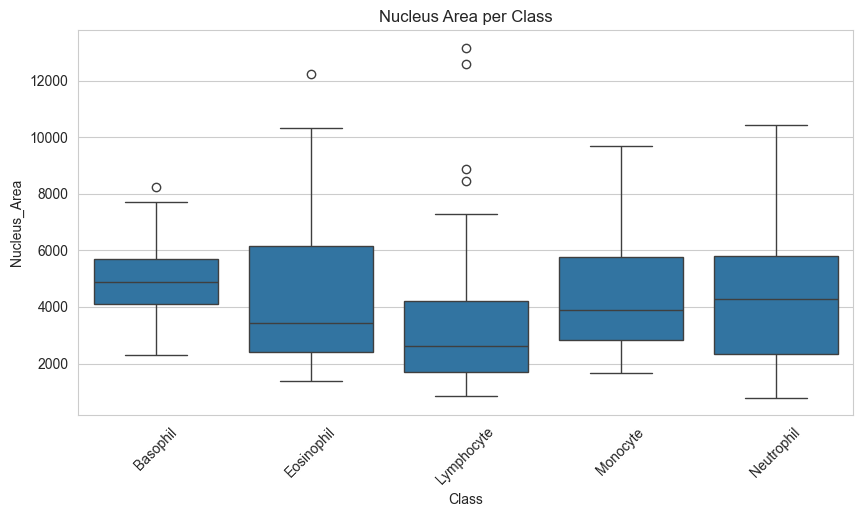

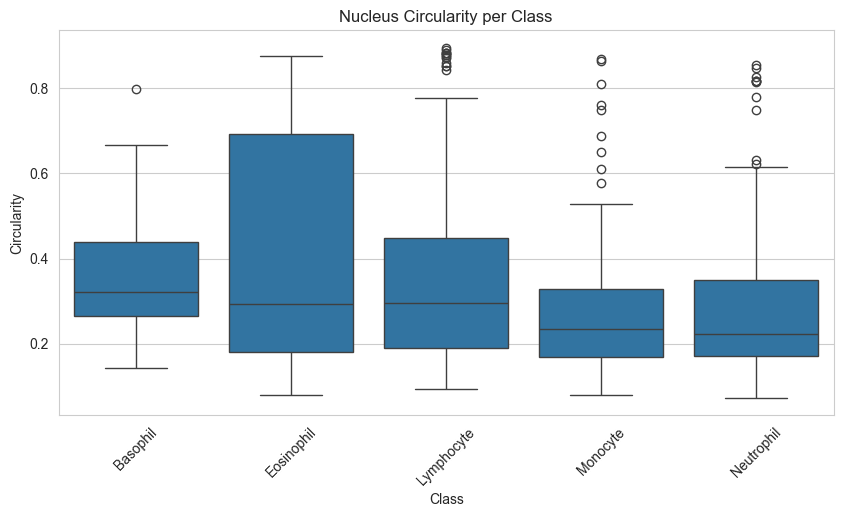

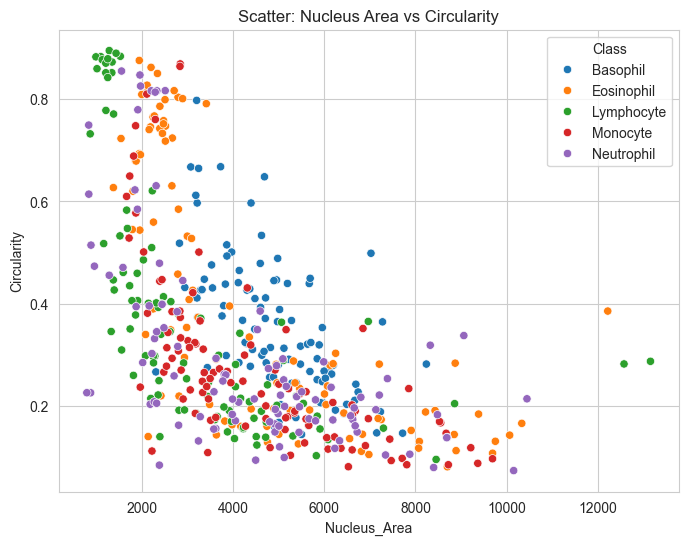

In [20]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

df = pd.read_csv("wbc_all_features.csv")

# Boxplot for nucleus area
plt.figure(figsize=(10, 5))
sns.boxplot(x='Class', y='Nucleus_Area', data=df)
plt.title("Nucleus Area per Class")
plt.xticks(rotation=45)
plt.show()

# Boxplot for Circularity
plt.figure(figsize=(10, 5))
sns.boxplot(x='Class', y='Circularity', data=df)
plt.title("Nucleus Circularity per Class")
plt.xticks(rotation=45)
plt.show()

# Scatter plot: Circularity vs Area
plt.figure(figsize=(8, 6))
sns.scatterplot(x='Nucleus_Area', y='Circularity', hue='Class', data=df)
plt.title("Scatter: Nucleus Area vs Circularity")
plt.show()


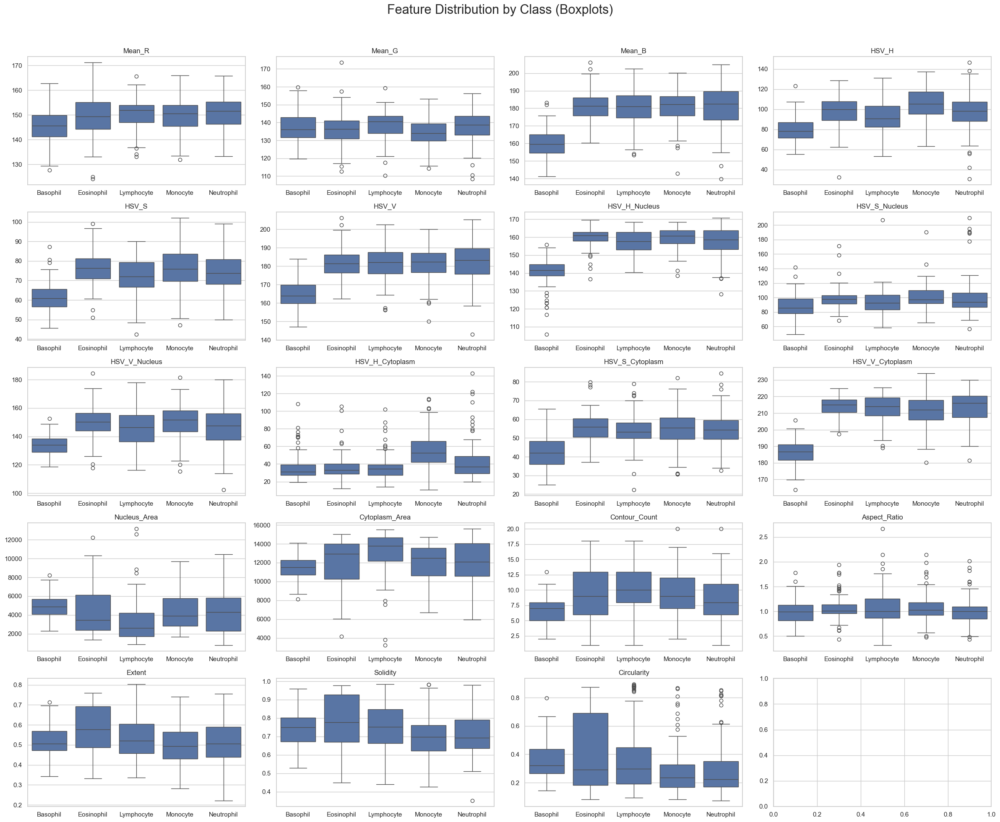

In [24]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load data
df = pd.read_csv("wbc_all_features.csv")

# All numerical features (exclude Class and Image columns)
features = [
    'Mean_R', 'Mean_G', 'Mean_B',
    'HSV_H', 'HSV_S', 'HSV_V',
    'HSV_H_Nucleus', 'HSV_S_Nucleus', 'HSV_V_Nucleus',
    'HSV_H_Cytoplasm', 'HSV_S_Cytoplasm', 'HSV_V_Cytoplasm',
    'Nucleus_Area', 'Cytoplasm_Area', 'Contour_Count',
    'Aspect_Ratio', 'Extent', 'Solidity', 'Circularity'
]

# Set plot style
sns.set(style="whitegrid")
fig, axes = plt.subplots(nrows=5, ncols=4, figsize=(24, 20))
fig.suptitle("Feature Distribution by Class (Boxplots)", fontsize=22)

# Plot each feature in a subplot
for i, feature in enumerate(features):
    row = i // 4
    col = i % 4
    ax = axes[row, col]
    sns.boxplot(data=df, x="Class", y=feature, ax=ax)
    ax.set_title(feature, fontsize=12)
    ax.set_xlabel("")  # Remove x-axis label for cleaner look
    ax.set_ylabel("")

# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.96])  # Leave space for suptitle
plt.savefig("wbc_all_features_boxplots.png")
plt.show()


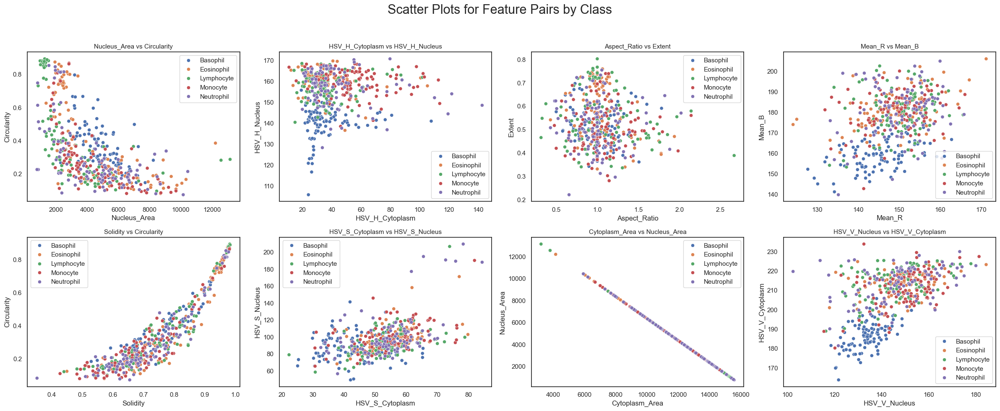

In [23]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load features
df = pd.read_csv("wbc_all_features.csv")

# Feature pairs for scatter plots
feature_pairs = [
    ("Nucleus_Area", "Circularity"),
    ("HSV_H_Cytoplasm", "HSV_H_Nucleus"),
    ("Aspect_Ratio", "Extent"),
    ("Mean_R", "Mean_B"),
    ("Solidity", "Circularity"),
    ("HSV_S_Cytoplasm", "HSV_S_Nucleus"),
    ("Cytoplasm_Area", "Nucleus_Area"),
    ("HSV_V_Nucleus", "HSV_V_Cytoplasm")
]

# Plot setup
sns.set(style="white")
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(24, 10))
fig.suptitle("Scatter Plots for Feature Pairs by Class", fontsize=22)

# Plot each pair
for i, (x_feature, y_feature) in enumerate(feature_pairs):
    row = i // 4
    col = i % 4
    ax = axes[row, col]
    sns.scatterplot(data=df, x=x_feature, y=y_feature, hue="Class", ax=ax)
    ax.set_title(f"{x_feature} vs {y_feature}", fontsize=11)
    ax.legend().set_title("")  # Remove legend title

# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.savefig("Scatter plot")
plt.show()


Saved grid image at: E:\2. DIP\random_50_wbc_grid.png


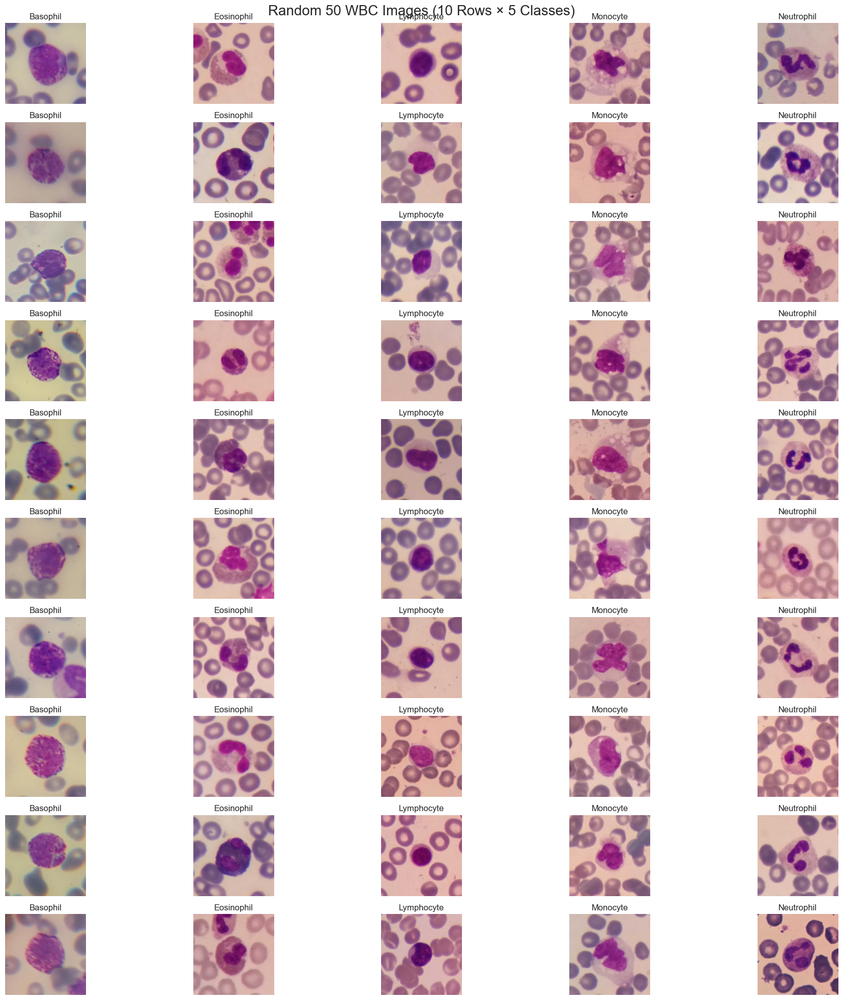

In [14]:
import os
import random
import cv2
import matplotlib.pyplot as plt

# Base directory and class order
base_dir = r"E:\2. DIP\2. LAB\pythonProject\Projects\Assignment 2\wbc_data\Train"
class_order = ["Basophil", "Eosinophil", "Lymphocyte", "Monocyte", "Neutrophil"]

# Collect image paths (10 per class)
image_paths = []
for cell_class in class_order:
    class_path = os.path.join(base_dir, cell_class)
    all_imgs = os.listdir(class_path)
    selected = random.sample(all_imgs, 10)  # select 10 random images
    full_paths = [os.path.join(class_path, img) for img in selected]
    image_paths.append(full_paths)

# Transpose the list to interleave class order row-wise
# Each row: Basophil, Eosinophil, ..., Neutrophil
interleaved = list(zip(*image_paths))  # 10 rows of 5 images
interleaved_flat = [img for row in interleaved for img in row]

# Plotting
plt.figure(figsize=(20, 20))
for i, path in enumerate(interleaved_flat):
    img = cv2.imread(path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.subplot(10, 5, i+1)
    plt.imshow(img)
    plt.title(os.path.basename(os.path.dirname(path)))  # class name
    plt.axis('off')

plt.suptitle("Random 50 WBC Images (10 Rows × 5 Classes)", fontsize=20)
plt.tight_layout()

# Save the figure before showing it
save_path = r"E:\2. DIP\random_50_wbc_grid.png"
plt.savefig(save_path, bbox_inches='tight', dpi=300)
print(f"Saved grid image at: {save_path}")

# Finally, show the plot
plt.show()


In [5]:
import os
import cv2
import numpy as np
import pandas as pd
from tqdm import tqdm

# Define class directories
base_dir = r"E:\2. DIP\2. LAB\pythonProject\Projects\Assignment 2\wbc_data\Train"
classes = ["Basophil", "Eosinophil", "Lymphocyte", "Monocyte", "Neutrophil"]

# Store features
data = []

# Loop through each class
for label in classes:
    class_dir = os.path.join(base_dir, label)
    for filename in tqdm(os.listdir(class_dir), desc=label):
        filepath = os.path.join(class_dir, filename)
        img_bgr = cv2.imread(filepath)

        if img_bgr is None:
            continue

        # Convert to RGB, HSV, Gray
        img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
        img_hsv = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2HSV)
        img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)

        # Calculate mean color values
        rgb_mean = np.mean(img_rgb, axis=(0, 1))  # [R, G, B]
        hsv_mean = np.mean(img_hsv, axis=(0, 1))  # [H, S, V]
        gray_mean = np.mean(img_gray)

        # Store
        data.append({
            "Label": label,
            "R_mean": rgb_mean[0],
            "G_mean": rgb_mean[1],
            "B_mean": rgb_mean[2],
            "H_mean": hsv_mean[0],
            "S_mean": hsv_mean[1],
            "V_mean": hsv_mean[2],
            "Gray_mean": gray_mean
        })

# Convert to DataFrame
df_colors = pd.DataFrame(data)

print(df_colors.head())


Neutrophil: 100%|██████████| 100/100 [00:01<00:00, 59.66it/s]

      Label      R_mean      G_mean      B_mean     H_mean     S_mean  \
0  Basophil  161.772564  142.856687  139.512514  68.360499  65.508331   
1  Basophil  157.376947  135.944904  149.946308  80.649676  62.918966   
2  Basophil  166.240327  135.200496  153.958790  99.367105  59.371384   
3  Basophil  164.402991  142.978374  153.881116  76.055785  64.404870   
4  Basophil  152.408188  133.692485  127.867793  70.510179  72.284588   

       V_mean   Gray_mean  
0  166.130577  148.126052  
1  165.459200  143.978353  
2  169.443726  146.630252  
3  171.176590  150.627333  
4  155.965977  138.631307  


In [6]:
df_colors.head()

,Label,R_mean,G_mean,B_mean,H_mean,S_mean,V_mean,Gray_mean
0,Basophil,161.772564,142.856687,139.512514,68.360499,65.508331,166.130577,148.126052
1,Basophil,157.376947,135.944904,149.946308,80.649676,62.918966,165.459200,143.978353
2,Basophil,166.240327,135.200496,153.958790,99.367105,59.371384,169.443726,146.630252
3,Basophil,164.402991,142.978374,153.881116,76.055785,64.404870,171.176590,150.627333
4,Basophil,152.408188,133.692485,127.867793,70.510179,72.284588,155.965977,138.631307


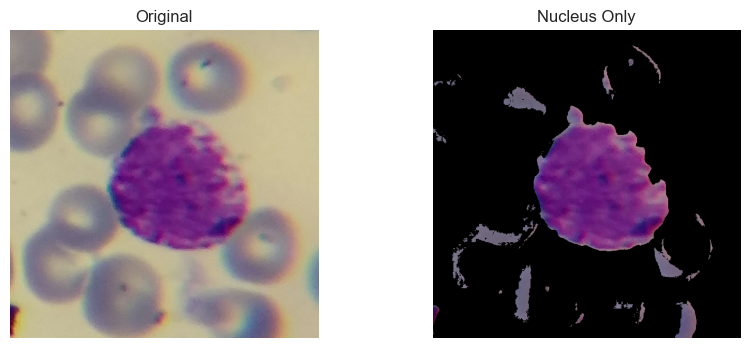

In [7]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load image
img = cv2.imread("E:\\2. DIP\\2. LAB\\pythonProject\\Projects\\Assignment 2\\wbc_data\\Train\\Basophil\\Basophil_1.jpg")
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

# Define range for purple nucleus in HSV
lower_purple = np.array([120, 40, 40])
upper_purple = np.array([170, 255, 255])

# Create mask
mask = cv2.inRange(img_hsv, lower_purple, upper_purple)

# Apply mask to get only nucleus
result = cv2.bitwise_and(img_rgb, img_rgb, mask=mask)

# Show result
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.title("Original")
plt.imshow(img_rgb)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title("Nucleus Only")
plt.imshow(result)
plt.axis('off')
plt.show()


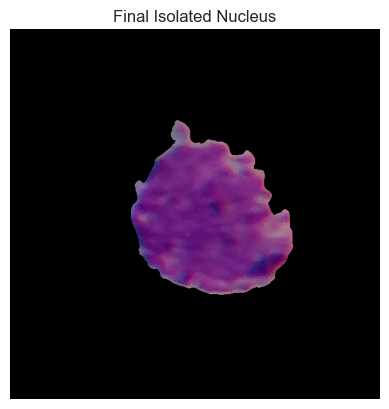

In [8]:
# 1. Create elliptical kernel
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7, 7))

# 2. Apply morphological opening
opened_mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)

# 3. Find contours
contours, _ = cv2.findContours(opened_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# 4. Find largest contour (assumed nucleus)
largest_contour = max(contours, key=cv2.contourArea)

# 5. Create a clean mask from the largest contour
final_mask = np.zeros_like(mask)
cv2.drawContours(final_mask, [largest_contour], -1, 255, thickness=cv2.FILLED)

# 6. Apply final mask to original image
final_result = cv2.bitwise_and(img_rgb, img_rgb, mask=final_mask)

# Optional: black background
black_background = np.zeros_like(img_rgb)
output = np.where(final_mask[:, :, None] == 255, final_result, black_background)

# Show result
plt.imshow(output)
plt.axis('off')
plt.title("Final Isolated Nucleus")
plt.show()


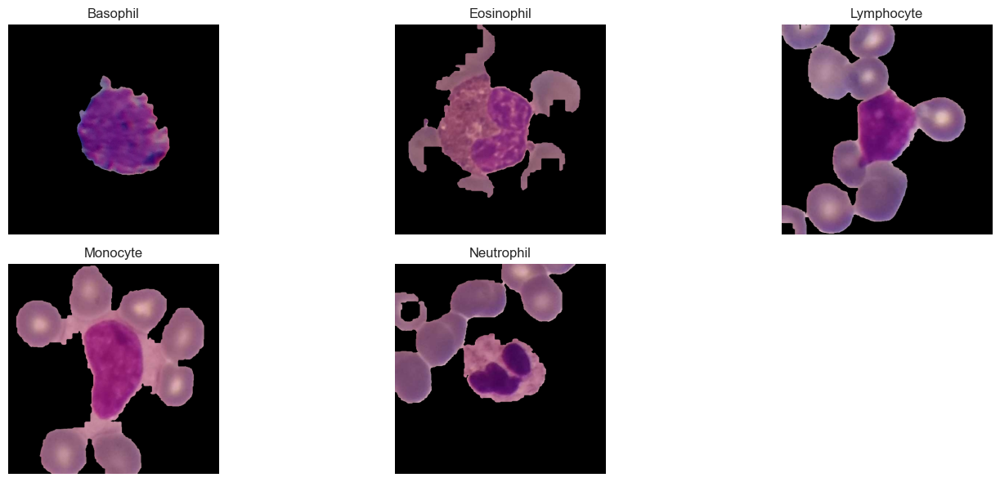

In [11]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Image paths
images = {
    "Basophil": r"E:\2. DIP\2. LAB\pythonProject\Projects\Assignment 2\wbc_data\Train\Basophil\Basophil_1.jpg",
    "Eosinophil": r"E:\2. DIP\2. LAB\pythonProject\Projects\Assignment 2\wbc_data\Train\Eosinophil\Eosinophil_1.jpg",
    "Lymphocyte": r"E:\2. DIP\2. LAB\pythonProject\Projects\Assignment 2\wbc_data\Train\Lymphocyte\Lymphocyte_1.jpg",
    "Monocyte": r"E:\2. DIP\2. LAB\pythonProject\Projects\Assignment 2\wbc_data\Train\Monocyte\Monocyte_1.jpg",
    "Neutrophil": r"E:\2. DIP\2. LAB\pythonProject\Projects\Assignment 2\wbc_data\Train\Neutrophil\Neutrophil_1.jpg"
}

def isolate_nucleus(image_path):
    img = cv2.imread(image_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

    # Purple range for nucleus
    lower_purple = np.array([120, 40, 40])
    upper_purple = np.array([170, 255, 255])
    mask = cv2.inRange(img_hsv, lower_purple, upper_purple)

    # Morphological cleaning
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7, 7))
    opened_mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)

    # Largest contour selection
    contours, _ = cv2.findContours(opened_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if len(contours) == 0:
        return img_rgb  # fallback
    largest_contour = max(contours, key=cv2.contourArea)
    final_mask = np.zeros_like(mask)
    cv2.drawContours(final_mask, [largest_contour], -1, 255, thickness=cv2.FILLED)

    # Mask application
    final_result = cv2.bitwise_and(img_rgb, img_rgb, mask=final_mask)
    black_background = np.zeros_like(img_rgb)
    output = np.where(final_mask[:, :, None] == 255, final_result, black_background)

    return output

# Plotting
plt.figure(figsize=(15, 6))
for idx, (label, path) in enumerate(images.items()):
    nucleus_img = isolate_nucleus(path)
    plt.subplot(2, 3, idx + 1)
    plt.imshow(nucleus_img)
    plt.title(label)
    plt.axis('off')

plt.tight_layout()
plt.show()


KeyError: 'Monocyte'

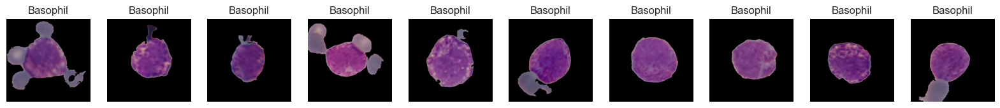

In [44]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import random

# Directories
base_dir = r"E:\2. DIP\2. LAB\pythonProject\Projects\Assignment 2\wbc_data\Train"
cell_types = ["Basophil"]

# HSV ranges (can be tuned)
hsv_ranges = {
    "Basophil": ([120, 40, 40], [170, 255, 255])
}

def isolate_nucleus(image_path, cell_type):
    img = cv2.imread(image_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    lower, upper = hsv_ranges[cell_type]
    mask = cv2.inRange(img_hsv, np.array(lower), np.array(upper))
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7, 7))
    opened_mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)
    contours, _ = cv2.findContours(opened_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    if not contours:
        print(f"[{cell_type}] No contours found!")
        return img_rgb

    largest_contour = max(contours, key=cv2.contourArea)
    final_mask = np.zeros_like(mask)
    cv2.drawContours(final_mask, [largest_contour], -1, 255, thickness=cv2.FILLED)
    masked_nucleus = cv2.bitwise_and(img_rgb, img_rgb, mask=final_mask)
    output = np.where(final_mask[:, :, None] == 255, masked_nucleus, np.zeros_like(img_rgb))
    return output

# Plotting
plt.figure(figsize=(20, 8))
img_index = 1

for cell_type in cell_types:
    class_path = os.path.join(base_dir, cell_type)
    all_imgs = os.listdir(class_path)
    selected_imgs = random.sample(all_imgs, 10)

    for img_name in selected_imgs:
        img_path = os.path.join(class_path, img_name)
        result = isolate_nucleus(img_path, cell_type)
        plt.subplot(2, 10, img_index)
        plt.imshow(result)
        plt.title(cell_type)
        plt.axis("off")
        img_index += 1

plt.suptitle("Nucleus Extraction: Basophil & Monocyte (10 Each)", fontsize=18)
plt.tight_layout()
plt.show()


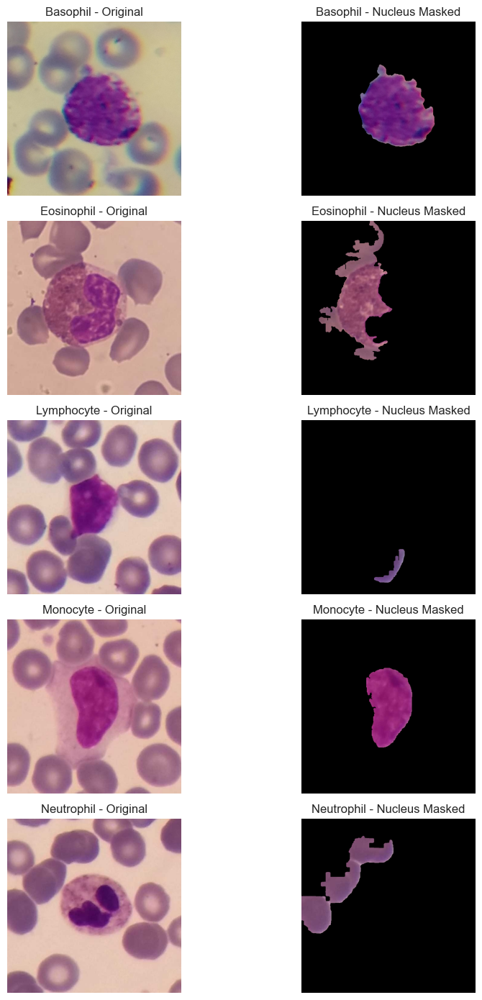

In [45]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

images = {
    "Basophil": r"E:\2. DIP\2. LAB\pythonProject\Projects\Assignment 2\wbc_data\Train\Basophil\Basophil_1.jpg",
    "Eosinophil": r"E:\2. DIP\2. LAB\pythonProject\Projects\Assignment 2\wbc_data\Train\Eosinophil\Eosinophil_1.jpg",
    "Lymphocyte": r"E:\2. DIP\2. LAB\pythonProject\Projects\Assignment 2\wbc_data\Train\Lymphocyte\Lymphocyte_1.jpg",
    "Monocyte": r"E:\2. DIP\2. LAB\pythonProject\Projects\Assignment 2\wbc_data\Train\Monocyte\Monocyte_1.jpg",
    "Neutrophil": r"E:\2. DIP\2. LAB\pythonProject\Projects\Assignment 2\wbc_data\Train\Neutrophil\Neutrophil_1.jpg"
}

hsv_ranges = {
    "Basophil":    ([120, 40, 40], [170, 255, 255]),
    "Eosinophil":  ([160, 80, 80], [180, 255, 255]),
    "Lymphocyte":  ([110, 40, 40], [140, 255, 255]),
    "Monocyte":    ([125, 30, 50], [160, 200, 255]),
    "Neutrophil":  ([120, 30, 40], [160, 255, 255])
}

def isolate_nucleus(image_path, cell_type):
    img = cv2.imread(image_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    lower = np.array(hsv_ranges[cell_type][0])
    upper = np.array(hsv_ranges[cell_type][1])
    mask = cv2.inRange(img_hsv, lower, upper)
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7, 7))
    opened_mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)
    contours, _ = cv2.findContours(opened_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    final_mask = np.zeros_like(mask)
    if contours:
        largest_contour = max(contours, key=cv2.contourArea)
        cv2.drawContours(final_mask, [largest_contour], -1, 255, thickness=cv2.FILLED)
    masked_nucleus = cv2.bitwise_and(img_rgb, img_rgb, mask=final_mask)
    black_background = np.zeros_like(img_rgb)
    output = np.where(final_mask[:, :, None] == 255, masked_nucleus, black_background)
    return img_rgb, output

fig, axs = plt.subplots(5, 2, figsize=(10, 14))
for idx, (cell_type, path) in enumerate(images.items()):
    original, masked = isolate_nucleus(path, cell_type)
    axs[idx, 0].imshow(original)
    axs[idx, 0].set_title(f"{cell_type} - Original")
    axs[idx, 0].axis('off')
    axs[idx, 1].imshow(masked)
    axs[idx, 1].set_title(f"{cell_type} - Nucleus Masked")
    axs[idx, 1].axis('off')

plt.tight_layout()
plt.show()


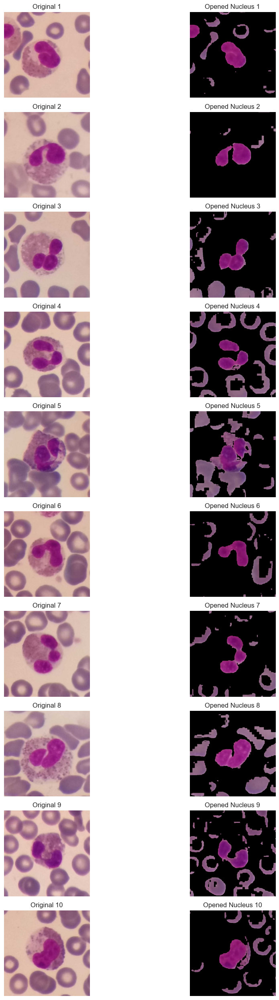

In [43]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import random

# Path to Monocyte images
monocyte_dir = r"E:\2. DIP\2. LAB\pythonProject\Projects\Assignment 2\wbc_data\Train\Eosinophil"
all_files = [f for f in os.listdir(monocyte_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
random_files = random.sample(all_files, 10)

# Plotting
plt.figure(figsize=(12, 25))

for i, file in enumerate(random_files):
    path = os.path.join(monocyte_dir, file)
    img = cv2.imread(path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Convert to HSV color space
    img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

    # Manually define purple range in HSV
    lower_purple = np.array([120, 50, 50])
    upper_purple = np.array([160, 255, 255])

    # Thresholding to get the purple regions (nucleus)
    nucleus_mask = cv2.inRange(img_hsv, lower_purple, upper_purple)

    # Morphological Opening: Erosion followed by Dilation
    kernel = np.ones((5, 5), np.uint8)
    nucleus_mask_opened = cv2.morphologyEx(nucleus_mask, cv2.MORPH_OPEN, kernel)

    # Apply the refined mask to the original image
    result = cv2.bitwise_and(img_rgb, img_rgb, mask=nucleus_mask_opened)

    # Plot original and result
    plt.subplot(10, 2, 2*i + 1)
    plt.imshow(img_rgb)
    plt.title(f"Original {i+1}")
    plt.axis('off')

    plt.subplot(10, 2, 2*i + 2)
    plt.imshow(result)
    plt.title(f"Opened Nucleus {i+1}")
    plt.axis('off')

plt.tight_layout()
plt.show()


Saved grid image at: E:\2. DIP\img_monocytes.png


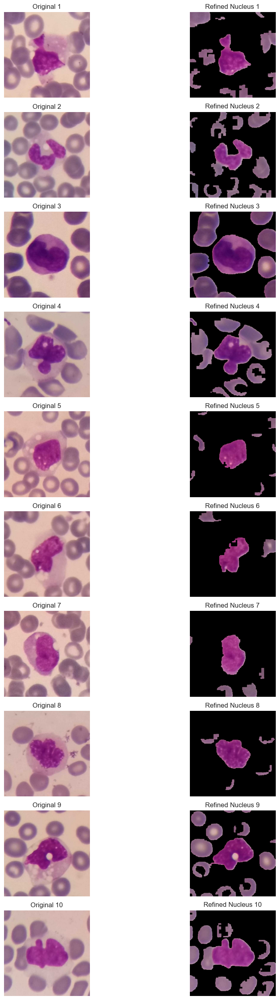

In [38]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import random

# Path to Monocyte images
monocyte_dir = r"E:\2. DIP\2. LAB\pythonProject\Projects\Assignment 2\wbc_data\Train\Monocyte"
all_files = [f for f in os.listdir(monocyte_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
random_files = random.sample(all_files, 10)

# Plotting
plt.figure(figsize=(12, 25))

for i, file in enumerate(random_files):
    path = os.path.join(monocyte_dir, file)
    img = cv2.imread(path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Convert to HSV color space
    img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

    # Manually define a more specific purple range in HSV
    lower_purple = np.array([130, 50, 50])  # Adjusted to be more specific
    upper_purple = np.array([160, 255, 255])

    # Thresholding to get the purple regions (nucleus)
    nucleus_mask = cv2.inRange(img_hsv, lower_purple, upper_purple)

    # Apply Gaussian Blur to smooth the mask
    nucleus_mask_blurred = cv2.GaussianBlur(nucleus_mask, (5, 5), 0)

    # Morphological Opening: Erosion followed by Dilation
    kernel = np.ones((7, 7), np.uint8)  # Larger kernel for more refinement
    nucleus_mask_opened = cv2.morphologyEx(nucleus_mask_blurred, cv2.MORPH_OPEN, kernel)

    # Optional: Apply morphological closing to fill gaps
    nucleus_mask_closed = cv2.morphologyEx(nucleus_mask_opened, cv2.MORPH_CLOSE, kernel)

    # Find contours and filter based on area
    contours, _ = cv2.findContours(nucleus_mask_closed, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    filtered_mask = np.zeros_like(nucleus_mask_closed)

    # Only keep large enough contours
    for contour in contours:
        if cv2.contourArea(contour) > 500:  # Adjust the area threshold as needed
            cv2.drawContours(filtered_mask, [contour], -1, 255, -1)

    # Apply the refined mask to the original image
    result = cv2.bitwise_and(img_rgb, img_rgb, mask=filtered_mask)

    # Plot original and result
    plt.subplot(10, 2, 2*i + 1)
    plt.imshow(img_rgb)
    plt.title(f"Original {i+1}")
    plt.axis('off')

    plt.subplot(10, 2, 2*i + 2)
    plt.imshow(result)
    plt.title(f"Refined Nucleus {i+1}")
    plt.axis('off')
save_path = r"E:\2. DIP\img_monocytes.png"
plt.savefig(save_path, bbox_inches='tight', dpi=300)
print(f"Saved grid image at: {save_path}")

plt.tight_layout()
plt.show()


Saved grid image at: E:\2. DIP\Lymphocyte.png


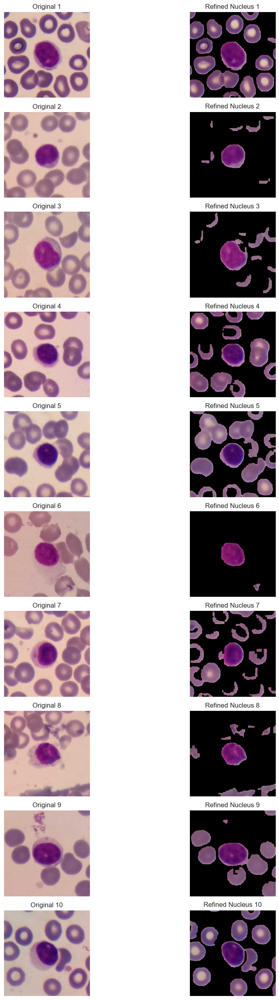

In [37]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import random

# Path to Monocyte images
monocyte_dir = r"E:\2. DIP\2. LAB\pythonProject\Projects\Assignment 2\wbc_data\Train\Lymphocyte"
all_files = [f for f in os.listdir(monocyte_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
random_files = random.sample(all_files, 10)

# Plotting
plt.figure(figsize=(12, 25))

for i, file in enumerate(random_files):
    path = os.path.join(monocyte_dir, file)
    img = cv2.imread(path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Convert to HSV color space
    img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

    # Manually define a more specific purple range in HSV
    lower_purple = np.array([130, 50, 50])  # Adjusted to be more specific
    upper_purple = np.array([160, 255, 255])

    # Thresholding to get the purple regions (nucleus)
    nucleus_mask = cv2.inRange(img_hsv, lower_purple, upper_purple)

    # Apply Gaussian Blur to smooth the mask
    nucleus_mask_blurred = cv2.GaussianBlur(nucleus_mask, (5, 5), 0)

    # Morphological Opening: Erosion followed by Dilation
    kernel = np.ones((7, 7), np.uint8)  # Larger kernel for more refinement
    nucleus_mask_opened = cv2.morphologyEx(nucleus_mask_blurred, cv2.MORPH_OPEN, kernel)

    # Optional: Apply morphological closing to fill gaps
    nucleus_mask_closed = cv2.morphologyEx(nucleus_mask_opened, cv2.MORPH_CLOSE, kernel)

    # Find contours and filter based on area
    contours, _ = cv2.findContours(nucleus_mask_closed, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    filtered_mask = np.zeros_like(nucleus_mask_closed)

    # Only keep large enough contours
    for contour in contours:
        if cv2.contourArea(contour) > 500:  # Adjust the area threshold as needed
            cv2.drawContours(filtered_mask, [contour], -1, 255, -1)

    # Apply the refined mask to the original image
    result = cv2.bitwise_and(img_rgb, img_rgb, mask=filtered_mask)

    # Plot original and result
    plt.subplot(10, 2, 2*i + 1)
    plt.imshow(img_rgb)
    plt.title(f"Original {i+1}")
    plt.axis('off')

    plt.subplot(10, 2, 2*i + 2)
    plt.imshow(result)
    plt.title(f"Refined Nucleus {i+1}")
    plt.axis('off')
save_path = r"E:\2. DIP\Lymphocyte.png"
plt.savefig(save_path, bbox_inches='tight', dpi=300)
print(f"Saved grid image at: {save_path}")

plt.tight_layout()
plt.show()


Saved grid image at: E:\2. DIP\Neutrophil.png


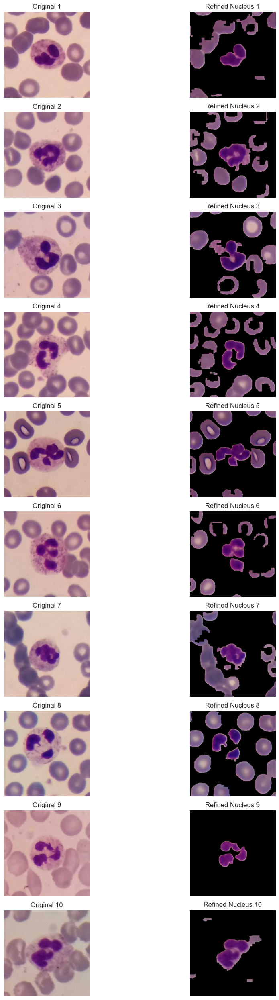

In [36]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import random

# Path to Monocyte images
monocyte_dir = r"E:\2. DIP\2. LAB\pythonProject\Projects\Assignment 2\wbc_data\Train\Neutrophil"
all_files = [f for f in os.listdir(monocyte_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
random_files = random.sample(all_files, 10)

# Plotting
plt.figure(figsize=(12, 25))

for i, file in enumerate(random_files):
    path = os.path.join(monocyte_dir, file)
    img = cv2.imread(path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Convert to HSV color space
    img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

    # Manually define a more specific purple range in HSV
    lower_purple = np.array([130, 50, 50])  # Adjusted to be more specific
    upper_purple = np.array([160, 255, 255])

    # Thresholding to get the purple regions (nucleus)
    nucleus_mask = cv2.inRange(img_hsv, lower_purple, upper_purple)

    # Apply Gaussian Blur to smooth the mask
    nucleus_mask_blurred = cv2.GaussianBlur(nucleus_mask, (5, 5), 0)

    # Morphological Opening: Erosion followed by Dilation
    kernel = np.ones((7, 7), np.uint8)  # Larger kernel for more refinement
    nucleus_mask_opened = cv2.morphologyEx(nucleus_mask_blurred, cv2.MORPH_OPEN, kernel)

    # Optional: Apply morphological closing to fill gaps
    nucleus_mask_closed = cv2.morphologyEx(nucleus_mask_opened, cv2.MORPH_CLOSE, kernel)

    # Find contours and filter based on area
    contours, _ = cv2.findContours(nucleus_mask_closed, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    filtered_mask = np.zeros_like(nucleus_mask_closed)

    # Only keep large enough contours
    for contour in contours:
        if cv2.contourArea(contour) > 500:  # Adjust the area threshold as needed
            cv2.drawContours(filtered_mask, [contour], -1, 255, -1)

    # Apply the refined mask to the original image
    result = cv2.bitwise_and(img_rgb, img_rgb, mask=filtered_mask)

    # Plot original and result
    plt.subplot(10, 2, 2*i + 1)
    plt.imshow(img_rgb)
    plt.title(f"Original {i+1}")
    plt.axis('off')

    plt.subplot(10, 2, 2*i + 2)
    plt.imshow(result)
    plt.title(f"Refined Nucleus {i+1}")
    plt.axis('off')
save_path = r"E:\2. DIP\Neutrophil.png"
plt.savefig(save_path, bbox_inches='tight', dpi=300)
print(f"Saved grid image at: {save_path}")

plt.tight_layout()
plt.show()


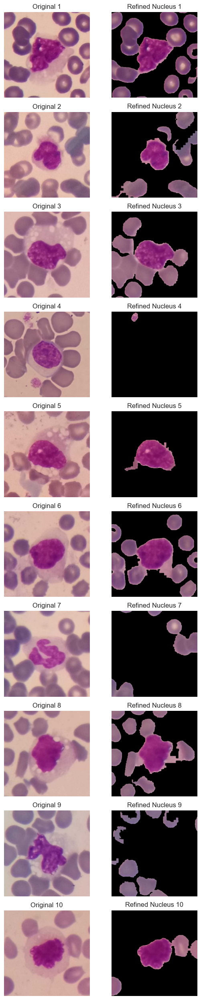

In [42]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import random

# Set path to folder containing monocyte images
image_folder = r'E:\2. DIP\2. LAB\pythonProject\Projects\Assignment 2\wbc_data\Train\Monocyte'
image_files = [f for f in os.listdir(image_folder) if f.endswith(('.png', '.jpg'))]
random.shuffle(image_files)
selected_images = image_files[:10]

def refine_nucleus(img):
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

    # HSV range for purple nucleus
    lower_purple = np.array([110, 50, 20])
    upper_purple = np.array([170, 255, 255])
    mask = cv2.inRange(img_hsv, lower_purple, upper_purple)

    # Morphology to remove noise
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)

    # Filter contours by area, shape, and hue
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    refined_mask = np.zeros_like(mask)
    for contour in contours:
        area = cv2.contourArea(contour)
        if area < 300:
            continue
        perimeter = cv2.arcLength(contour, True)
        if perimeter == 0:
            continue
        circularity = 4 * np.pi * (area / (perimeter ** 2))
        if circularity < 0.2:
            continue
        temp_mask = np.zeros_like(mask)
        cv2.drawContours(temp_mask, [contour], -1, 255, -1)
        mean_val = cv2.mean(img_hsv, mask=temp_mask)
        hue = mean_val[0]
        if not (110 <= hue <= 165):
            continue
        cv2.drawContours(refined_mask, [contour], -1, 255, -1)

    result = cv2.bitwise_and(img_rgb, img_rgb, mask=refined_mask)
    return img_rgb, result

# Plotting
fig, axs = plt.subplots(10, 2, figsize=(6, 25))
for i, fname in enumerate(selected_images):
    img = cv2.imread(os.path.join(image_folder, fname))
    original, refined = refine_nucleus(img)

    axs[i, 0].imshow(original)
    axs[i, 0].set_title(f'Original {i+1}')
    axs[i, 0].axis('off')

    axs[i, 1].imshow(refined)
    axs[i, 1].set_title(f'Refined Nucleus {i+1}')
    axs[i, 1].axis('off')

plt.tight_layout()
plt.show()
